# Testing Snowplow Algorithm

Consideration: if no unserviced edges except for u-turning, consider probabilistically choosing to traverse a serviced edge to escape a local area.

In [1]:
import os
%load_ext autoreload
%autoreload 2

In [2]:
import Snowplow_Routing_Middleton.dual_graphs as dual_graphs
import Snowplow_Routing_Middleton.construction as construction
import Snowplow_Routing_Middleton.plotting as plotting
import Snowplow_Routing_Middleton.local_search as local_search
import Snowplow_Routing_Middleton.initialize as initialize
import Snowplow_Routing_Middleton.params as params
import Snowplow_Routing_Middleton.sectioning as sectioning
import Snowplow_Routing_Middleton.costs as costs


from Snowplow_Routing_Middleton.shortest_paths import ShortestPaths
from Snowplow_Routing_Middleton.crossover import apply_crossover
from Snowplow_Routing_Middleton.genetic import run_genetic
from Snowplow_Routing_Middleton.solution import Solution
from Snowplow_Routing_Middleton.costs import routes_cost, calculate_time_deadheading
from Snowplow_Routing_Middleton.routes_representations import create_full_routes_with_returns
from Snowplow_Routing_Middleton.turns import turn_direction_count

import pandas as pd
import osmnx as ox
import folium
import folium.plugins
import networkx as nx
import matplotlib.pyplot as plt


Autoreload documentation: https://ipython.readthedocs.io/en/stable/config/extensions/autoreload.html

For reloading user modules

In [3]:
toyEdgeFile = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Snowplow-Routing-Middleton\\Snowplow-Routing-Middleton\\graph_data\\edges.csv"
toyNodeFile = "C:\\Users\\Sneez\\Desktop\\Snowplowing\\Snowplow-Routing-Middleton\\Snowplow-Routing-Middleton\\graph_data\\nodes.csv"

In [4]:
curr_path = os.path.abspath("")
parent_path = os.path.split(curr_path)[0]

In [31]:
instance = "sectionedfullstreets"

polygon_path = os.path.join(parent_path, "graph_data\\individual_sections\\route1_blue.gpkg")

match instance:
    case "smallstreets":
        G = initialize.create_small_streets()
    case "fullstreets":
        G = initialize.create_full_streets()
    case "smalltoy":
        G = initialize.create_small_toy(toyEdgeFile, toyNodeFile)
    case "sectionedfullstreets":
        G = sectioning.section_component(polygon_path, False)
    case _:
        print("Invalid instance name")
     

In [32]:
ox.graph_to_gdfs(G, nodes=False, edges=True).explore()

Update depot

In [33]:
if instance == "fullstreets" or instance == "sectionedfullstreets":
    params.DEPOT = params.find_depot(G)[0]
else:
    params.DEPOT = 0
params.DEPOT

136

In [34]:
approach = "genetic"

if approach == "genetic":
    G = initialize.add_multi_edges(G)
    if instance == "smallstreets" or instance == "fullstreets" or instance == "sectionedfullstreets":
        G_DUAL = dual_graphs.create_dual_streets(G, params.DEPOT)
    else:
        G_DUAL = dual_graphs.create_dual_toy(G)

elif approach == "annealing":
    if instance == "smallstreets" or instance == "fullstreets" or instance == "sectionedfullstreets":
        G_DUAL = dual_graphs.create_dual_streets(G, False, True)
    else:
        G_DUAL = dual_graphs.create_dual_toy(G, False, True)



Adding depot source 136


In [35]:
print(G)
print(G_DUAL)

MultiDiGraph with 170 nodes and 637 edges
MultiDiGraph with 638 nodes and 3521 edges


In [36]:
blue_shortest_paths_folderpath  = os.path.join(parent_path, "graph_data\\shortest_paths\\route1_blue")


In [37]:
sp = ShortestPaths(G_DUAL, True, False, blue_shortest_paths_folderpath)

In [38]:
r, rreq = construction.route_generation(G, sp, params.DEPOT)

Test Local Search

In [39]:
required_edges = set(edge[:3] for edge in G.edges(data=True, keys=True) if edge[3]['priority'] != 0)
S_first = Solution(rreq, dict(), routes_cost(G, sp, rreq, params.DEPOT), 0)

print(S_first.cost)


Deadheading time hours: 1.5271013101668076
32372.244310353584


In [40]:
_, head = local_search.individual_to_linked_list(rreq, params.DEPOT)
print("Linked list costs:", costs.routes_cost_linked_list(G, sp, head, params.DEPOT))
print("Normal cost:", routes_cost(G, sp, rreq, params.DEPOT))

Linked list costs: 32372.244310353584
Deadheading time hours: 1.5271013101668076
Normal cost: 32372.244310353584


In [41]:
serviced = set()
for route in S_first.routes:
    for edge in route:
        serviced.add(edge[:3])
print(len(serviced), len(required_edges))

563 563


In [42]:
S_new = local_search.local_improve(S_first, G, sp, required_edges, params.DEPOT, threshold=1)
print(routes_cost(G, sp, S_new.routes, params.DEPOT))
for route in S_new.routes:
    for routestep in route:
        print(routestep)
    print("***")

Deadheading time hours: 1.524771114532042
31654.71176622744
(137, 138, 1)
(136, 137, 0)
(137, 138, 0)
(138, 137, 0)
(139, 140, 0)
(138, 137, 1)
(137, 139, 0)
(140, 141, 0)
(141, 151, 0)
(151, 138, 0)
(138, 136, 0)
(136, 135, 0)
(135, 116, 0)
(116, 68, 0)
(68, 67, 0)
(67, 115, 0)
(115, 83, 0)
(83, 81, 0)
(81, 79, 0)
(79, 64, 0)
(86, 71, 0)
(71, 32, 0)
(32, 69, 0)
(69, 69, 0)
(69, 32, 0)
(32, 71, 0)
(71, 152, 0)
(152, 22, 0)
(22, 148, 0)
(148, 60, 0)
(60, 61, 0)
(62, 64, 0)
(71, 32, 1)
(32, 69, 1)
(69, 32, 1)
(32, 71, 1)
(71, 32, 2)
(32, 69, 2)
(69, 32, 2)
(32, 71, 2)
(32, 70, 0)
(70, 92, 0)
(92, 89, 1)
(89, 91, 0)
(91, 89, 0)
(89, 92, 0)
(92, 95, 0)
(95, 99, 0)
(99, 96, 0)
(96, 160, 0)
(160, 123, 0)
(123, 127, 0)
(127, 122, 0)
(122, 102, 1)
(102, 121, 1)
(121, 126, 0)
(126, 130, 0)
(130, 168, 0)
(168, 168, 0)
(168, 130, 0)
(130, 126, 1)
(126, 121, 0)
(121, 102, 0)
(102, 100, 0)
(100, 58, 0)
(58, 57, 0)
(57, 59, 0)
(59, 33, 0)
(33, 34, 0)
(59, 34, 2)
(31, 30, 0)
(30, 16, 0)
(16, 32, 0)
(

{'straight': 370, 'u-turn': 124, 'right': 108, 'left': 56, 'sharp left': 39, 'sharp right': 43}


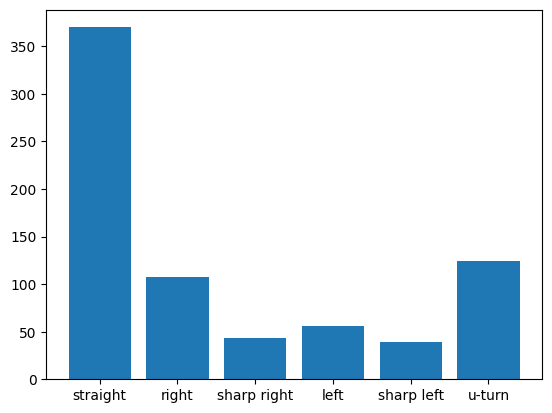

In [43]:
full_routes = create_full_routes_with_returns(G, sp, rreq, params.DEPOT)
counts, x_axis, y_axis = turn_direction_count(G_DUAL, full_routes)
print(counts)
plt.bar(x_axis, y_axis)
plotting.plot_moving_routes_folium(G, full_routes, label_color="blue", path_color="blue", m=None)

In [23]:
s1, s1req = construction.route_generation(G, sp, params.DEPOT)
S1 = Solution(s1req, dict(), routes_cost(G, sp, s1req, params.DEPOT), 0)
S1 = local_search.local_improve(S1, G, sp, required_edges, params.DEPOT, threshold=1)

s2, s2req = construction.route_generation(G, sp, params.DEPOT)
S2 = Solution(s2req, dict(), routes_cost(G, sp, s2req, params.DEPOT), 0)
S2 = local_search.local_improve(S2, G, sp, required_edges, params.DEPOT, threshold=1)

In [ ]:
S0 = apply_crossover(G, sp, S1.routes, S2.routes, params.DEPOT)
# idea for crossover: don't crossover a whole subsection of routes, but rather a fixed chunk (say 20-30 routesteps) of a route. This would significantly improve computation speed

In [ ]:
count0, count1, count2 = 0, 0, 0
for route in S0:
    for routestep in route:
        count0 += 1
for route in S1.routes:
    for routestep in route:
        count1 += 1
for route in S2.routes:
    for routestep in route:
        count2 += 1


print(count0, count1, count2)

654 654 654


In [92]:
# 4. Route Improvement Algorithms
sol = run_genetic(G, sp, params.DEPOT)

for route in sol.routes:
    for edge in route:
        print(edge)
    print("***")

initial generation 0
Total required edges is  537


C:\Users\Sneez\Desktop\Snowplowing\Snowplow_Routing_Middleton\Snowplow_Routing_Middleton\construction.py:290: RuntimeWarning: invalid value encountered in divide
  weights_turns = weights_turns / np.sum(weights_turns)


initial generation 1
Total required edges is  537
initial generation 2
Total required edges is  537
initial generation 3
Total required edges is  537
initial generation 4
Total required edges is  537
initial generation 5
Total required edges is  537
initial generation 6
Total required edges is  537
initial generation 7
Total required edges is  537
initial generation 8
Total required edges is  537
initial generation 9
Total required edges is  537
Iteration 0
New best solution found
Iteration 1
Iteration 2
New best solution found
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
New best solution found
Iteration 9
Iteration 10
Iteration 11
New best solution found
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
(111, 110, 0)
(110, 111, 1)
(113, 109, 1)
(109, 108, 1)
(108, 88, 1)
(88, 108, 1)
(108, 109, 1)
(109, 113, 1)
(113, 110, 0)
(110, 111, 0)
(

In [155]:
first_full_route = create_full_routes_with_returns(G, sp, rreq, params.DEPOT)
time_seconds_first = costs.route_travel_time(G, first_full_route, params.DEPOT)
print("First route cost", routes_cost(G, sp, rreq, params.DEPOT))
print("First route travel time hours", time_seconds_first/3600)
print("First route deadhead time hours", calculate_time_deadheading(rreq, sp, params.DEPOT)/3600)

Deadheading time hours: 1.2998248806515404
First route cost 33841.1103417144
First route travel time hours 6.389109071770866
First route deadhead time hours 1.2856999949838404


In [106]:
final_full_route = create_full_routes_with_returns(G, sp, sol.routes, params.DEPOT)
time_seconds = costs.route_travel_time(G, final_full_route, params.DEPOT)
# Display costs and travel time
print("Final Routes cost", sol.cost)
print("Final Travel time hours", time_seconds/3600)
print("Final Deadhead time hours", calculate_time_deadheading(sol.routes, sp, params.DEPOT)/3600)

Final Routes cost 28430.17239818484
Final Travel time hours 6.3652580577156765
Final Deadhead time hours 1.203406190235389


In [98]:
plotting.plot_moving_routes_folium(G, final_full_route, label_color="blue", path_color="blue", m=None)

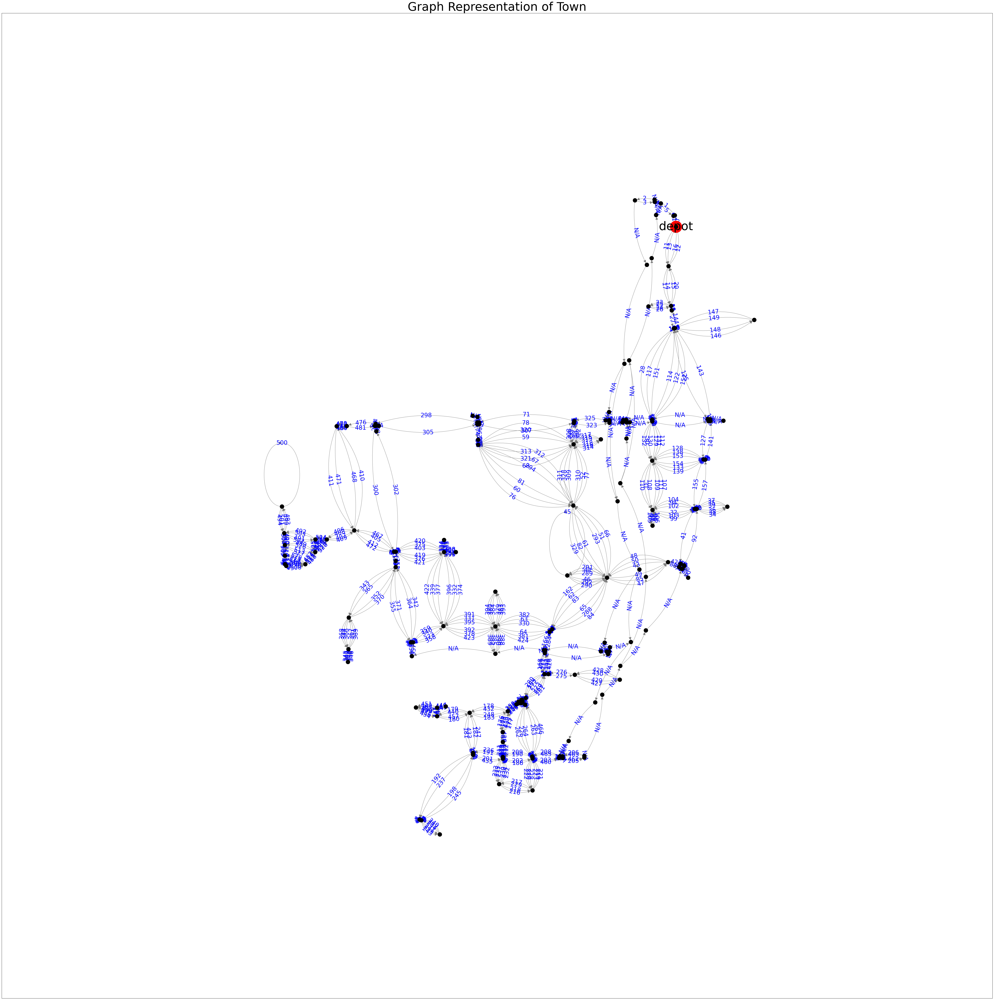

DONE


In [51]:
# 5. Plot final routes
G_graph = plotting.add_order_attribute(G, sol.routes)
plotting.draw_labeled_multigraph(G_graph, 'order', size=(75,75), plotDepot=True)

print("DONE")

## Plot the routes using Folium

In [ ]:
new_m = folium.Map(location=[43.1, -89.5], zoom_start=12)
count = 0
for i, edge in enumerate(final_full_route):
    edge_data = G.get_edge_data(edge[0], edge[1], edge[2])
        
    if edge_data is not None:
            
        if i < len(final_full_route)-1:
            edge_data_next = G.get_edge_data(final_full_route[i+1][0], final_full_route[i+1][1], final_full_route[i+1][2])
            if edge_data_next is not None and "name" in edge_data_next and "name" in edge_data:
                if edge_data_next["name"] == edge_data["name"]:
                    continue
        lstring = edge_data['geometry']
        # swap long lat to lat long
        lstring = lstring.__class__([(y, x) for x, y in lstring.coords])
        midpoint = len(list(lstring.coords))//2
        icon_number = folium.plugins.BeautifyIcon(
            border_color="#00ABDC",
            border_width=1,
            text_color="#00ABDC",
            number=count,
            inner_icon_style="margin-top:2;",
        )
        folium.PolyLine(locations=lstring.coords, color='blue', weight=1, tooltip=edge_data).add_to(new_m)
        folium.Marker(location=lstring.coords[midpoint], popup=f"Edge {count}", icon=icon_number).add_to(new_m)
        count += 1
new_m